In [ ]:
# Data handling
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    LabelBinarizer,
    LabelEncoder,
    MinMaxScaler,
    OrdinalEncoder,
    PolynomialFeatures,
    StandardScaler,
    label_binarize
)

# Model selection
from sklearn.model_selection import KFold, cross_val_predict, cross_val_score, train_test_split
from imblearn.over_sampling import SMOTE

# Regression & Classification models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC, SVR
from sklearn.tree import DecisionTreeClassifier

# Clustering
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage

# Evaluation metrics
from sklearn.metrics import (
    accuracy_score,
    auc,
    classification_report,
    confusion_matrix,
    f1_score,
    mean_squared_error,
    precision_score,
    r2_score,
    recall_score,
    roc_curve,
    silhouette_score
)

# Anomaly detection
from sklearn.svm import OneClassSVM
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import LocalOutlierFactor
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import zscore






In [ ]:
df = pd.read_csv("mental_health_and_technology_usage_2024.csv")



---



#*Lab #1: Preprocessing.*

In [ ]:
print(df.head()) # Print the first couple of rows to get an idea of the dataset.

      User_ID  Age  Gender  Technology_Usage_Hours  Social_Media_Usage_Hours  \
0  USER-00001   23  Female                    6.57                      6.00   
1  USER-00002   21    Male                    3.01                      2.57   
2  USER-00003   51    Male                    3.04                      6.14   
3  USER-00004   25  Female                    3.84                      4.48   
4  USER-00005   53    Male                    1.20                      0.56   

   Gaming_Hours  Screen_Time_Hours Mental_Health_Status Stress_Level  \
0          0.68              12.36                 Good          Low   
1          3.74               7.61                 Poor         High   
2          1.26               3.16                 Fair         High   
3          2.59              13.08            Excellent       Medium   
4          0.29              12.63                 Good          Low   

   Sleep_Hours  Physical_Activity_Hours Support_Systems_Access  \
0         8.01      

- *Consistency of data types:*

In [ ]:
print(df.info()) # Ensuring consistency of data types. Data types are as consistent as they should be.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6635 entries, 0 to 6634
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   User_ID                   6635 non-null   object 
 1   Age                       6635 non-null   int64  
 2   Gender                    6635 non-null   object 
 3   Technology_Usage_Hours    6635 non-null   float64
 4   Social_Media_Usage_Hours  6635 non-null   float64
 5   Gaming_Hours              6635 non-null   float64
 6   Screen_Time_Hours         6635 non-null   float64
 7   Mental_Health_Status      6635 non-null   object 
 8   Stress_Level              6635 non-null   object 
 9   Sleep_Hours               6635 non-null   float64
 10  Physical_Activity_Hours   6635 non-null   float64
 11  Support_Systems_Access    6635 non-null   object 
 12  Work_Environment_Impact   6635 non-null   object 
 13  Online_Support_Usage      6635 non-null   object 
dtypes: float

- *Missing values:*

In [ ]:
# Check for missing values in each column:
print(df.isnull().sum()) # Shows the count of missing values per column. All are 0 means no missing values.

User_ID                     0
Age                         0
Gender                      0
Technology_Usage_Hours      0
Social_Media_Usage_Hours    0
Gaming_Hours                0
Screen_Time_Hours           0
Mental_Health_Status        0
Stress_Level                0
Sleep_Hours                 0
Physical_Activity_Hours     0
Support_Systems_Access      0
Work_Environment_Impact     0
Online_Support_Usage        0
dtype: int64


- *Duplicates:*

In [ ]:
# Check for duplicated rows:
print(df.duplicated().sum()) # Shows the number of duplicated rows. The output is 0 means no duplicates.

0



*   *Outliers*
(calculate outliers)

In [ ]:
#Select numerical columns
numeric_columns = ["Age", "Technology_Usage_Hours", "Social_Media_Usage_Hours",
                   "Gaming_Hours", "Screen_Time_Hours", "Sleep_Hours", "Physical_Activity_Hours"]


In [ ]:
#Calculate IQR

for col in numeric_columns:
    Q1 = np.percentile(df[col], 25)  # First quartile (Q1)
    Q3 = np.percentile(df[col], 75)  # Third quartile (Q3)
    IQR = Q3 - Q1  # Interquartile range

    lower_bound = Q1 - 1.5 * IQR  # Lower threshold
    upper_bound = Q3 + 1.5 * IQR  # Upper threshold

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]

    print(col, "outliers:", len(outliers))


Age outliers: 0
Technology_Usage_Hours outliers: 0
Social_Media_Usage_Hours outliers: 0
Gaming_Hours outliers: 0
Screen_Time_Hours outliers: 0
Sleep_Hours outliers: 0
Physical_Activity_Hours outliers: 0



*   *Detecting* *Outliers*



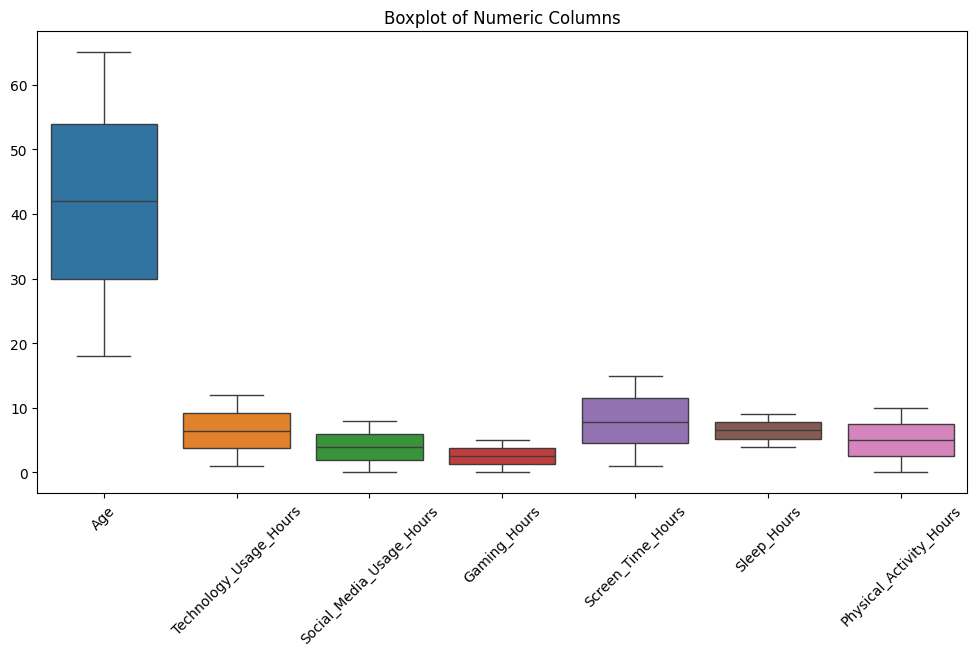

In [ ]:
# Create a boxplot for all numeric columns
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[numeric_columns])
plt.xticks(rotation=45)  # Rotate column names for better readability
plt.title("Boxplot of Numeric Columns")
plt.show()

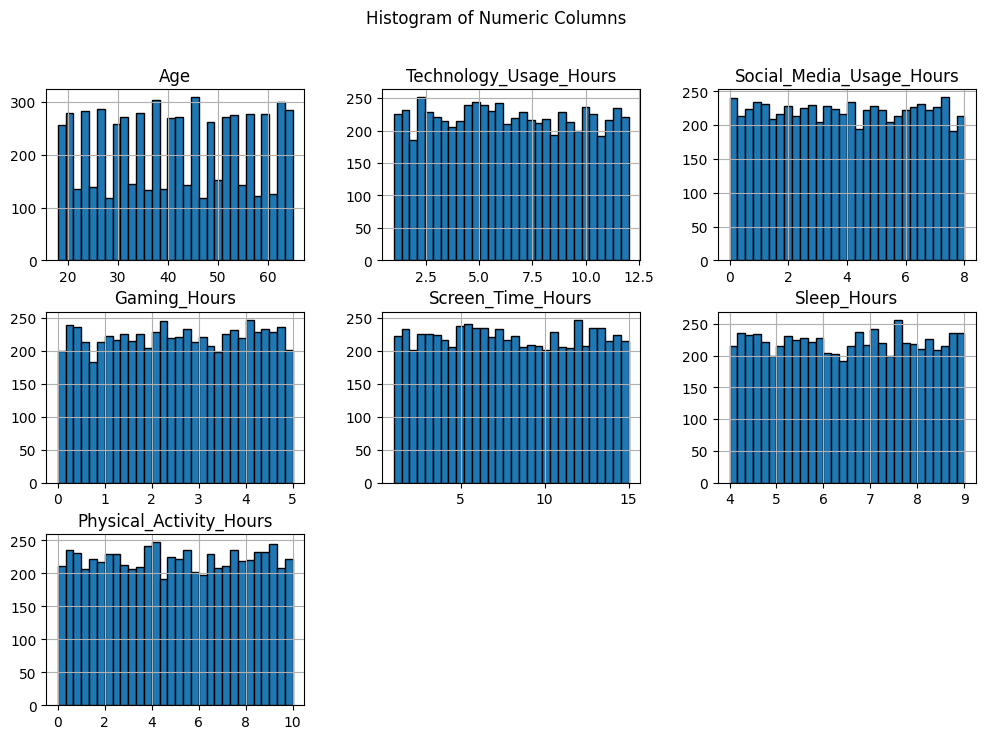

In [ ]:
df[numeric_columns].hist(figsize=(12, 8), bins=30, edgecolor="black")
plt.suptitle("Histogram of Numeric Columns")
plt.show()

 *Normalizing values*




In [ ]:
# the dataset
data_set = ("/content/mental_health_and_technology_usage_2024.csv")

# Load the dataset
df = pd.read_csv(data_set)

# Display the original data
print("Data before normalization:\n", df.head())

# Function to check if normalization is needed
def needs_normalization(df):
    numeric_df = df.select_dtypes(include=['number'])  # Select only numerical columns
    return any(numeric_df.max() > 1) or any(numeric_df.min() < 0)

if needs_normalization(df):
    print("\nWarning: The data is not normalized. Normalization will be applied.\n")

    # Apply Min-Max Normalization to numerical columns only
    numeric_cols = df.select_dtypes(include=['number']).columns
    scaler = MinMaxScaler()
    df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

    # Display the normalized data
    print("Data after normalization:\n", df.head())
else:
    print("\nThe data is already normalized. No changes were made.")

# We applied normalization using the Min-Max Normalization technique, which transforms numerical values into a range between 0 and 1.


Data before normalization:
       User_ID  Age  Gender  Technology_Usage_Hours  Social_Media_Usage_Hours  \
0  USER-00001   23  Female                    6.57                      6.00   
1  USER-00002   21    Male                    3.01                      2.57   
2  USER-00003   51    Male                    3.04                      6.14   
3  USER-00004   25  Female                    3.84                      4.48   
4  USER-00005   53    Male                    1.20                      0.56   

   Gaming_Hours  Screen_Time_Hours Mental_Health_Status Stress_Level  \
0          0.68              12.36                 Good          Low   
1          3.74               7.61                 Poor         High   
2          1.26               3.16                 Fair         High   
3          2.59              13.08            Excellent       Medium   
4          0.29              12.63                 Good          Low   

   Sleep_Hours  Physical_Activity_Hours Support_Systems_Ac



---



  
#*Lab #2: Linear and Nonlinear Regression.*

## **Simple Linear Regression:**

### **Using the 80% training dataset and 20% testing method:**

In [ ]:
# Split the data 80% training and 20% testing.

X = df[['Age']] # the input
y = df['Screen_Time_Hours'] # the output

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
model = LinearRegression()
model.fit(X_train, y_train) # Creating the model and adding the input and output training sets

y_pred = model.predict(X_test)

In [ ]:
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)

# Calculate R²
r2 = r2_score(y_test, y_pred)
print("R²:", r2)

# Calculate Adjusted R²
n = len(y_test)  # Number of observations
p = 1  # Number of predictors
adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
print("Adjusted R²:", adj_r2)

RMSE: 4.084034776259361
R²: -0.00045820241828398167
Adjusted R²: -0.0012132652125618204


### **Using the K-fold method:**

In [ ]:
model2 = LinearRegression()

# Split the data using K-fold method.

kf = KFold(n_splits=5)

# Store MSE for each fold
rmse_values = []
r2_values = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train the model
    model2.fit(X_train, y_train)

     # Predict and evaluate
    predictions = model2.predict(X_test)

    rmse = root_mean_squared_error(y_test, predictions)
    rmse_values.append(rmse)

    r2 = r2_score(y_test, predictions)

    r2_values.append(r2)

# Average metrics
average_rmse = np.mean(rmse_values)
average_r2 = np.mean(r2_values)

# Calculating Adjusted R²
n = len(y)  # Total number of samples
p = X.shape[1]  # Number of predictors
adjusted_r2 = 1 - (1 - average_r2) * (n - 1) / (n - p - 1)

print(f'Average RMSE: ', average_rmse)
print(f'Average R²: ', average_r2)
print(f'Adjusted R²: ', adjusted_r2)

Average RMSE:  4.051162907390359
Average R²:  -0.004100730207338232
Adjusted R²:  -0.004252109783730029


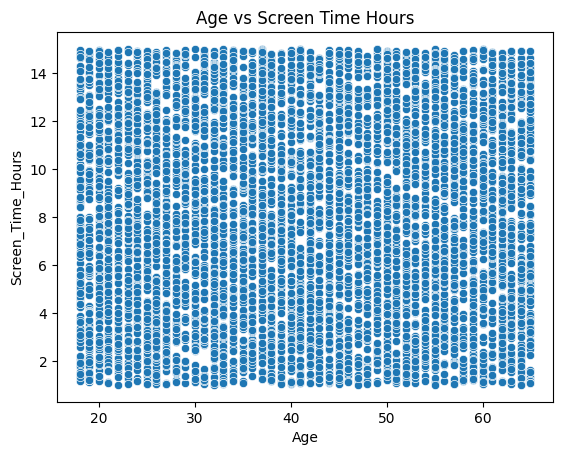

In [ ]:
sns.scatterplot(x=df['Age'], y=df['Screen_Time_Hours'])
plt.title('Age vs Screen Time Hours')
plt.show()



---



## **Simple Non-linear Regression:**

### **Using the 80% training dataset and 20% testing method:**

In [ ]:
# Split the data 80% training and 20% testing.

X = df[['Age']] # the input
y = df['Screen_Time_Hours'] # the output

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Create an SVR (Support Vector Regression) model using the RBF (Radial Basis Function) kernel
svr_model = SVR(kernel='rbf')

# Train the SVR model on the training data (features and target)
svr_model.fit(X_train, y_train)

# Predict the target values for the test data using the trained model
y_pred = svr_model.predict(X_test)

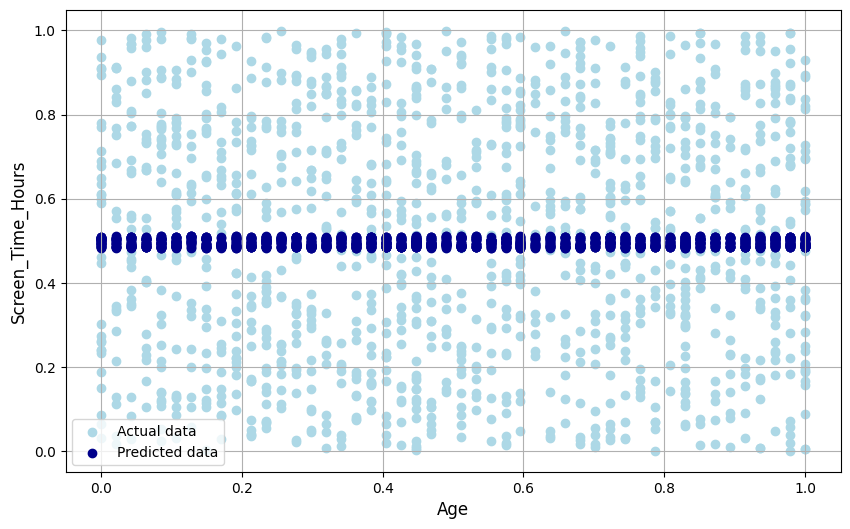

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
# Plotting the actual data points
plt.scatter(X_test, y_test, color='lightblue', label='Actual data')
# Plotting the predicted data points
plt.scatter(X_test, y_pred, color='darkblue', label='Predicted data')
# Labeling the axes with appropriate font size
plt.xlabel('Age', fontsize=12)
plt.ylabel('Screen_Time_Hours', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Calculate the Root Mean Squared Error (RMSE) between actual and predicted values
rmse_value = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse_value)

# Calculate the R-squared (coefficient of determination)
r2_value = r2_score(y_test, y_pred)
print("R²:", r2_value)

# Get the number of samples in the test set
n_samples = len(y_test)  # number of samples

# Get the number of predictive features (independent variables)
n_features = X_train.shape[1]  # number of features

# Calculate the Adjusted R-squared to account for the number of predictors
adj_r2_value = 1 - (1 - r2_value) * (n_samples - 1) / (n_samples - n_features - 1)
print("Adjusted R²:", adj_r2_value)

RMSE: 0.2919797799231982
R²: -0.0022630305816417895
Adjusted R²: -0.0030194555103826293


### **Using the K-fold method:**

In [ ]:
# Initialize KFold cross-validation with 5 splits
kf_splitter = KFold(n_splits=5)

# Lists to store the RMSE, R², and Adjusted R² values for each fold
rmse_values = []
r2_values = []
adj_r2_values = []

# Initialize fold number for tracking the iterations
fold_num = 1

# Loop through each fold in the KFold cross-validation
for train_idx, test_idx in kf_splitter.split(X):
    # Split data into training and testing sets
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Initialize the SVR model with RBF kernel
    svr_model = SVR(kernel='rbf')

    # Train the SVR model on the training data
    svr_model.fit(X_train, y_train)

    # Predict the target values for the test data
    predictions = svr_model.predict(X_test)

In [ ]:
    # Calculate RMSE for the current fold and store it
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    rmse_values.append(rmse)

    # Calculate R² for the current fold and store it
    r2 = r2_score(y_test, predictions)
    r2_values.append(r2)

    # Calculate Adjusted R² for the current fold and store it
    n_samples_fold = len(y_test)          # Number of samples in the current test set
    n_features_fold = X_train.shape[1]    # Number of features
    adj_r2 = 1 - (1 - r2) * (n_samples_fold - 1) / (n_samples_fold - n_features_fold - 1)
    adj_r2_values.append(adj_r2)

print(f'RMSE: {np.mean(rmse_values)}')
print(f'R²: {np.mean(r2_values)}')
print(f'Adjusted R²: {np.mean(adj_r2_values)}')

RMSE: 0.28730642803223083
R²: -0.007152692432864205
Adjusted R²: -0.007912807672436184


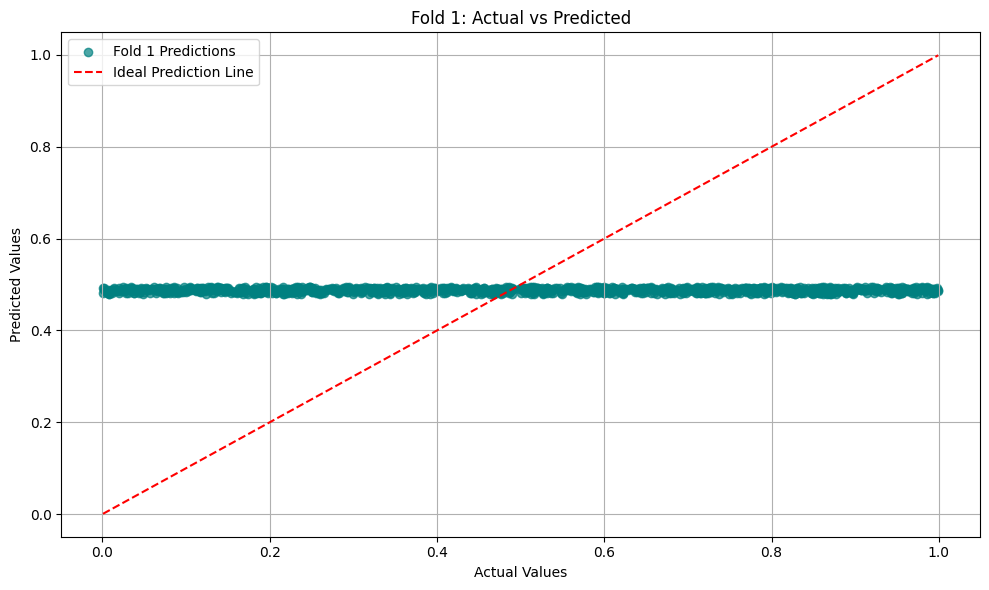

In [ ]:
# Plotting actual vs predicted values for each fold
plt.figure(figsize=(10, 6))
# Plotting actual values vs predictions for the current fold
plt.scatter(y_test, predictions, color='teal', alpha=0.7, label=f'Fold {fold_num} Predictions')
# Plotting the ideal prediction line (y = x) for comparison
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label="Ideal Prediction Line")
# Labeling the axes and adding a title
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(f'Fold {fold_num}: Actual vs Predicted')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Incrementing fold number for the next iteration
fold_num += 1

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


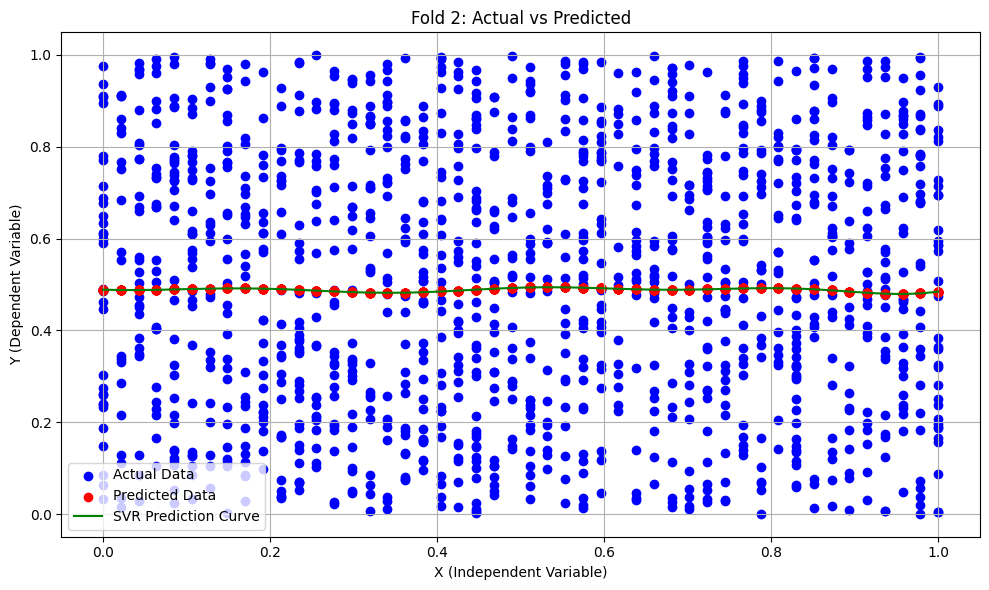

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
# Plotting the actual data points
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
# Plotting the predicted data points
plt.scatter(X_test, predictions, color='red', label='Predicted Data')
# Plotting the prediction curve
X_range = np.linspace(X_test.min(), X_test.max(), 100).reshape(-1, 1)
y_range = svr_model.predict(X_range)
plt.plot(X_range, y_range, color='green', label='SVR Prediction Curve')

# Setting the title, labels, and legend
plt.title(f'Fold {fold_num}: Actual vs Predicted')
plt.xlabel('X (Independent Variable)')
plt.ylabel('Y (Dependent Variable)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Incrementing fold number for the next iteration
fold_num += 1



---



## **Multiple Linear Regression:**

### **Using the 80% training dataset and 20% testing method:**

In [ ]:
# Encode Stress_Level as ordinal
encoder_stress = OrdinalEncoder(categories=[['Low', 'Medium', 'High']])
df['Stress_Level_Encoded'] = encoder_stress.fit_transform(df[['Stress_Level']])

# Encode Work_Environment_Impact as ordinal
encoder_work = OrdinalEncoder(categories = [['Negative', 'Neutral', 'Positive']])
df['Work_Impact_Encoded'] = encoder_work.fit_transform(df[['Work_Environment_Impact']])

# Define the independent variables (inputs) using encoded columns
X = df[['Sleep_Hours', 'Work_Impact_Encoded']]

# Target variable (stress level)
y = df['Stress_Level_Encoded'].astype(int)  # Ensure it's in integer format for classification

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


In [ ]:
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)

# Calculate R²
r2 = r2_score(y_test, y_pred)
print("R²:", r2)

# Calculate Adjusted R²
n = X_test.shape[0]  # عدد الصفوف
p = X_test.shape[1]  # عدد المتغيرات

adjusted_r2 = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
print("Adjusted R²:", adjusted_r2)

RMSE: 0.9760544996210344
R²: -0.45159049798514816
Adjusted R²: -0.45378323287636446


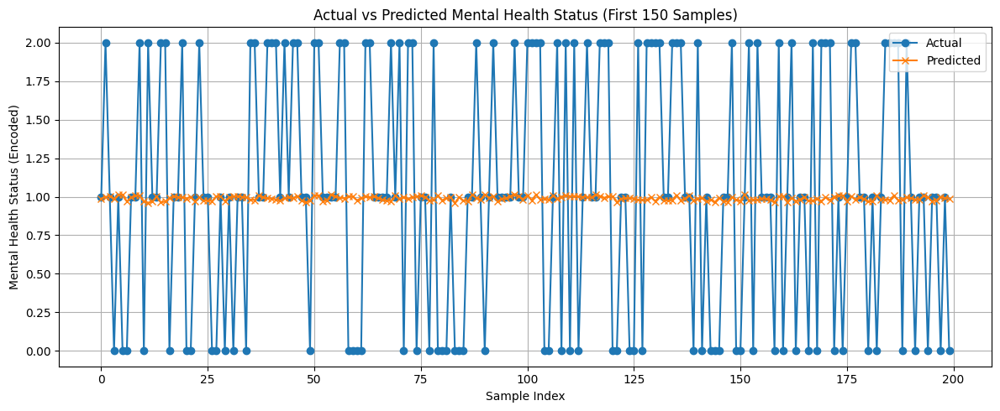

In [ ]:
# Convert values to NumPy arrays if they aren't already
y_test_array = np.array(y_test)
y_pred_array = np.array(y_pred)

# Plot only the first 150 samples for easier visualization
plt.figure(figsize=(12, 5))
plt.plot(y_test_array[:200], label='Actual', marker='o')      # Plot actual values
plt.plot(y_pred_array[:200], label='Predicted', marker='x')   # Plot predicted values
plt.title('Actual vs Predicted Mental Health Status (First 150 Samples)')
plt.xlabel('Sample Index')
plt.ylabel('Mental Health Status (Encoded)')
plt.legend()        # Show legend
plt.grid(True)      # Add grid lines to the plot
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()          # Display the plot



### **Using the K-fold method:**

In [ ]:
X = df[['Sleep_Hours', 'Technology_Usage_Hours', 'Work_Environment_Impact']].dropna()
df = df.loc[X.index]


encoder = OrdinalEncoder(categories=[['Low', 'Medium', 'High']])
y = encoder.fit_transform(df[['Stress_Level']]).ravel()

impact_encoder = OrdinalEncoder(categories = [['Negative', 'Neutral', 'Positive']])
X[['Work_Environment_Impact']] = impact_encoder.fit_transform(X[['Work_Environment_Impact']])

model2 = LinearRegression()

# K-Fold Cross Validation
kf = KFold(n_splits=5)

# RMSE and R²
rmse_values = []
r2_values = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # train the model
    model.fit(X_train, y_train)

    # predict
    predictions = model.predict(X_test)

In [ ]:
 # Calculate RMSE for this fold
rmse = np.sqrt(mean_squared_error(y_test, predictions))
rmse_values.append(rmse)

    # Calculate R² for this fold
r2 = r2_score(y_test, predictions)
r2_values.append(r2)

# Calculate average metrics
average_rmse = np.mean(rmse_values)
average_r2 = np.mean(r2_values)

# Calculate Adjusted R²
n = len(y)  # Total number of samples
p = X.shape[1]  # Number of predictors
adjusted_r2 = 1 - (1 - average_r2) * (n - 1) / (n - p - 1)

# Print the results
print(f'RMSE: {average_rmse}')
print(f'R²: {average_r2}')
print(f'Adjusted R²: {adjusted_r2}')

RMSE: 0.8064605988459846
R²: -0.00010366422410779119
Adjusted R²: -0.0004052636403395482


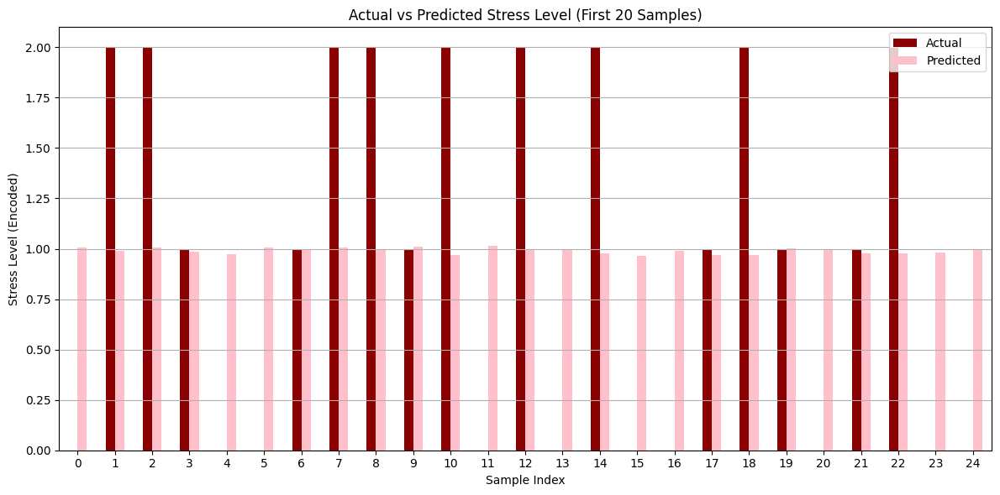

In [ ]:
y_pred = model.predict(X)

num_samples = 25
y_actual_sample = y[:num_samples].reset_index(drop=True)
y_pred_sample = pd.Series(y_pred[:num_samples]).reset_index(drop=True)

comparison_df = pd.DataFrame({
    'Actual': y_actual_sample,
    'Predicted': y_pred_sample
})

comparison_df.plot(kind='bar', figsize=(12, 6), color=['darkred', 'pink'])
plt.title('Actual vs Predicted Stress Level (First 20 Samples)')
plt.xlabel('Sample Index')
plt.ylabel('Stress Level (Encoded)')
plt.xticks(rotation=0)
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()



---



## **Multiple Non-linear Regression:**

### **Using the 80% training dataset and 20% testing method:**

In [ ]:
# Define features and target variable
X = df[['Age', 'Gender', 'Social_Media_Usage_Hours','Sleep_Hours']]
y = df['Gaming_Hours']

# Encode categorical variable Gender
label_encoder_gender = LabelEncoder()
X.loc[:, 'Gender'] = label_encoder_gender.fit_transform(X['Gender'])

# Split data into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert features to polynomial (nonlinear) features
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train the model
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Make predictions on test set
y_pred = model.predict(X_test_poly)

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))  # Root Mean Squared Error
r2 = r2_score(y_test, y_pred)                       # R-squared

# Calculate Adjusted R-squared
n = X_test.shape[0]  # number of samples
p = X_test_poly.shape[1]  # number of features after polynomial transformation
adjusted_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)

# Print results
print("RMSE:", rmse)
print("R²:", r2)
print("Adjusted R²:", adjusted_r2 , "\n")


RMSE: 0.2884768676907802
R²: -0.002055025340004235
Adjusted R²: -0.012747685671376185 



### **Using the K-fold method:**

RMSE: 0.2888849133001377
R²: -0.003703211605608381
Adjusted R²: -0.005825846796315037 



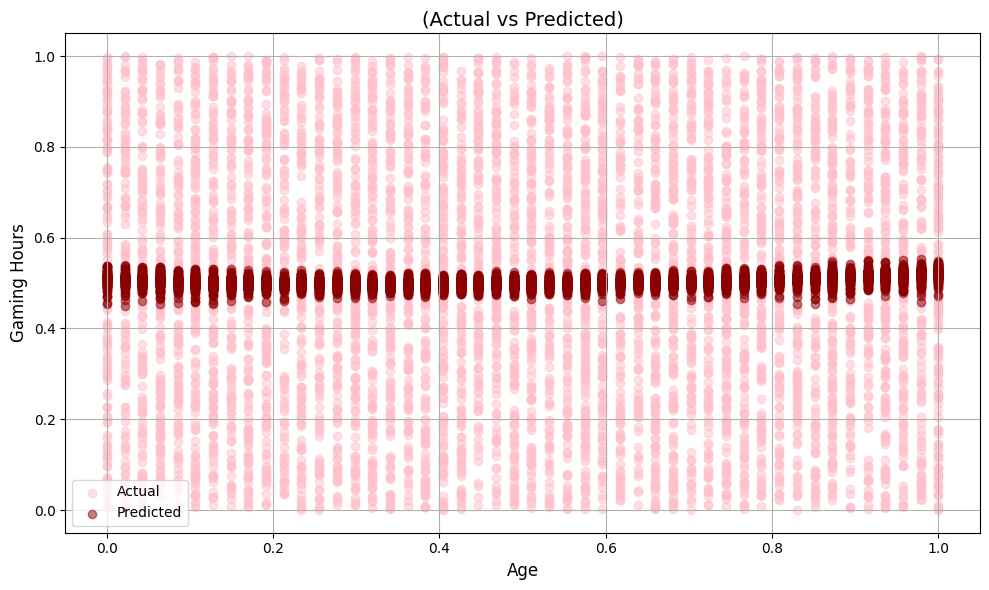

In [ ]:
# Encode categorical variable Gender
X = df[['Age', 'Gender', 'Social_Media_Usage_Hours','Sleep_Hours']]
y = df['Gaming_Hours']

label_encoder_gender = LabelEncoder()
X.loc[:, 'Gender'] = label_encoder_gender.fit_transform(X['Gender'])

# Convert features to polynomial (nonlinear) features
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)

# Set up K-Fold Cross Validation with 5 folds
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Train model instance
model = LinearRegression()

# Make cross-validated predictions
y_pred_cv = cross_val_predict(model, X_poly, y, cv=kf)

# Evaluate performance
rmse_cv = np.sqrt(mean_squared_error(y, y_pred_cv))  # RMSE for cross-validated predictions
r2_cv = r2_score(y, y_pred_cv)                       # R² for cross-validated predictions

# Adjusted R² for K-Fold
n = X.shape[0]  # total samples
p = X_poly.shape[1]  # total polynomial features
adjusted_r2_cv = 1 - ((1 - r2_cv) * (n - 1)) / (n - p - 1)

# Print results
print("RMSE:", rmse_cv)
print("R²:", r2_cv)
print("Adjusted R²:", adjusted_r2_cv , "\n")

# Visualization: Actual vs Predicted (K-Fold)
plt.figure(figsize=(10, 6))
plt.scatter(X['Age'], y, color='pink', alpha=0.5, label='Actual')
plt.scatter(X['Age'], y_pred_cv, color='darkred', alpha=0.5, label='Predicted')
plt.xlabel('Age', fontsize=12)
plt.ylabel('Gaming Hours', fontsize=12)
plt.title('(Actual vs Predicted)', fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#*Lab #3: Classification.*

## **Decision Tree:**

In [ ]:
# Create a new binary target where if stress level is medium it is included as high
df['Stress_Binary'] = df['Stress_Level'].apply(lambda x: 0 if x == 'Low' else 1)

X = df.drop(columns=['User_ID', 'Stress_Level', 'Stress_Binary'])  # drop targets and ID
y = df['Stress_Binary']

# Encode categorical features
label_encoders = {}
for col in X.select_dtypes(include='object').columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le

kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = DecisionTreeClassifier(max_depth=5, min_samples_leaf=10, class_weight='balanced')

all_y_true = []
all_y_pred = []
all_y_scores = []

sm = SMOTE(random_state=42)

# Perform K-Fold cross-validation
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)
    y_score = model.predict_proba(X_test)

    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)
    all_y_scores.append(y_score)

all_y_scores = np.vstack(all_y_scores)

# Evaluate the model using confusion matrix and classification report
conf_matrix = confusion_matrix(all_y_true, all_y_pred, labels=[0, 1])
class_report = classification_report(all_y_true, all_y_pred)

# Print the results
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

scores = cross_val_score(model, X, y, cv=kf)
print("Average Accuracy:", scores.mean())

Confusion Matrix:
[[ 926 1293]
 [1827 2589]]

Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.42      0.37      2219
           1       0.67      0.59      0.62      4416

    accuracy                           0.53      6635
   macro avg       0.50      0.50      0.50      6635
weighted avg       0.56      0.53      0.54      6635

Average Accuracy: 0.507912584777694


In [ ]:
# Fit the model first
model.fit(X, y)

# Get feature importances
importances = model.feature_importances_

# Combine with column names
feature_importance = pd.Series(importances, index=X.columns)
feature_importance = feature_importance.sort_values(ascending=False)

print("Top features influencing stress level:")
print(feature_importance)

Top features influencing stress level:
Sleep_Hours                 0.289621
Gaming_Hours                0.212861
Social_Media_Usage_Hours    0.199082
Physical_Activity_Hours     0.185136
Screen_Time_Hours           0.094365
Age                         0.018935
Technology_Usage_Hours      0.000000
Gender                      0.000000
Mental_Health_Status        0.000000
Support_Systems_Access      0.000000
Work_Environment_Impact     0.000000
Online_Support_Usage        0.000000
dtype: float64


<ipython-input-10-3fce7125cda3>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feat_imp_df, palette='viridis')


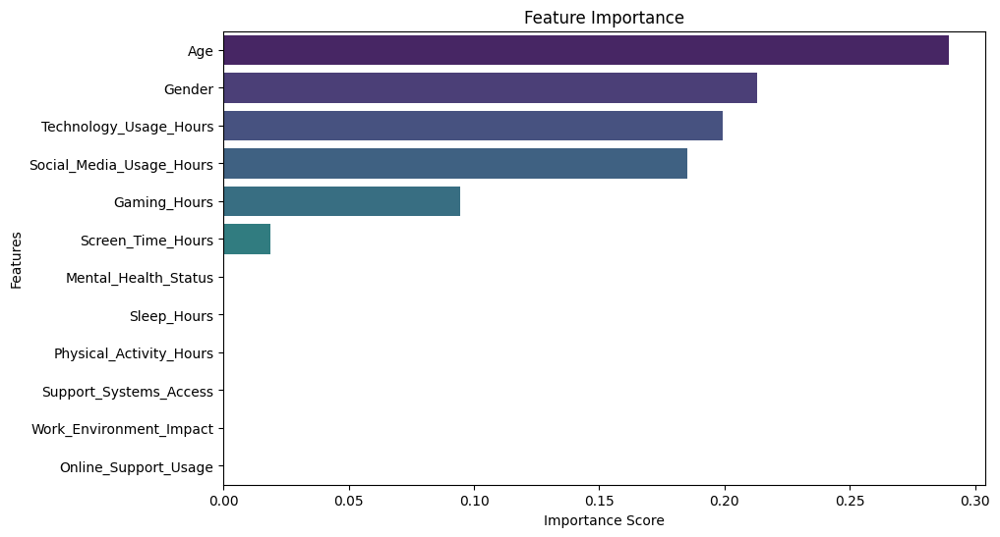

In [ ]:
features_list = X_train.columns.tolist()

importances = feature_importance

feat_imp_df = pd.DataFrame({'Feature': features_list, 'Importance': importances})

feat_imp_df = feat_imp_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp_df, palette='viridis')
plt.title('Feature Importance')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

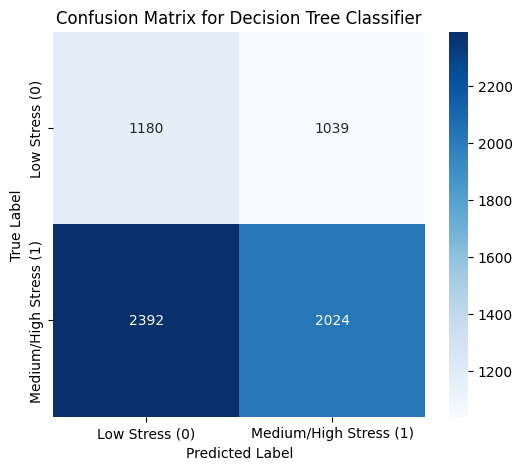

In [ ]:
labels = ['Low Stress (0)', 'Medium/High Stress (1)']

plt.figure(figsize=(6,5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

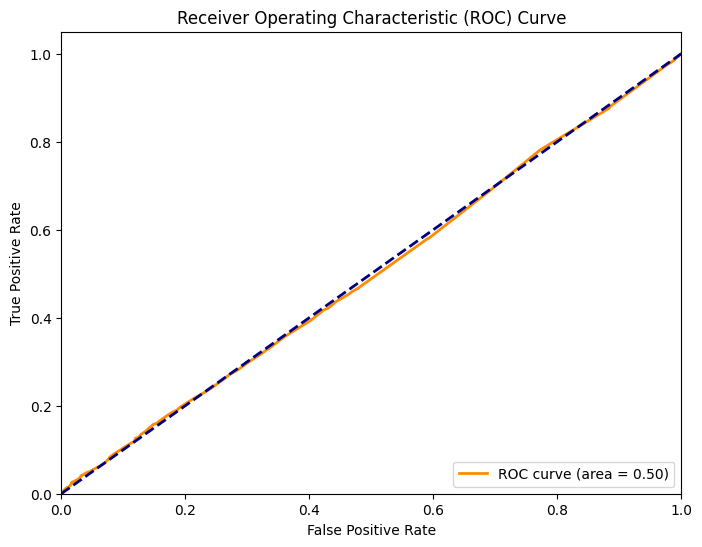

In [ ]:
# Assuming all_y_true and all_y_scores (probabilities) are collected from your cross-validation

# Get the predicted probabilities for the positive class (class 1)
y_scores = all_y_scores[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(all_y_true, y_scores)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

## **Random Forest:**

In [ ]:
#  Define features and target
X = df[['Age', 'Mental_Health_Status', 'Sleep_Hours']]
y = df['Stress_Level']  # <-- Keep target values as strings: "Low", "Medium", "High"

#  Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#  Specify categorical columns
categorical_features = ['Mental_Health_Status']

#  Apply encoding only to the categorical column
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_features)
    ],
    remainder='passthrough'  # Leave numeric columns as-is
)

#  Build the pipeline with preprocessing and classifier
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

#  Train the model
model.fit(X_train, y_train)

#  Make predictions on the test set
predictions = model.predict(X_test)

#  Print a sample of predictions vs actual values
for i in range(5):
    print(f"Expected: {y_test.iloc[i]} - Predicted: {predictions[i]}")


Expected: Low - Predicted: High
Expected: High - Predicted: Low
Expected: Low - Predicted: High
Expected: Low - Predicted: Low
Expected: High - Predicted: Low


In [ ]:
# Generate and print the classification report
report = classification_report(y_test, predictions)
print(report)

              precision    recall  f1-score   support

        High       0.32      0.31      0.32       469
         Low       0.31      0.34      0.32       405
      Medium       0.32      0.29      0.31       453

    accuracy                           0.32      1327
   macro avg       0.32      0.32      0.32      1327
weighted avg       0.32      0.32      0.32      1327



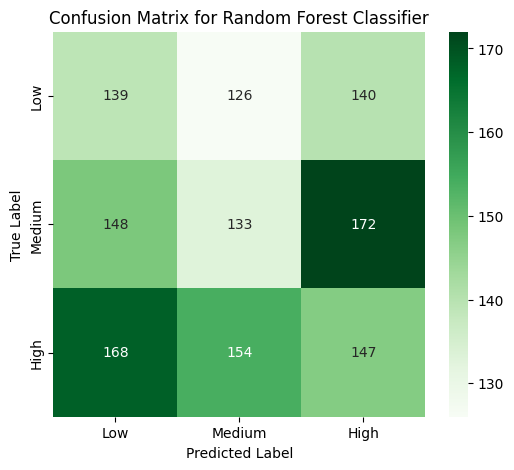

In [ ]:
classes = ['Low', 'Medium', 'High']
cm = confusion_matrix(y_test, predictions, labels=classes)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

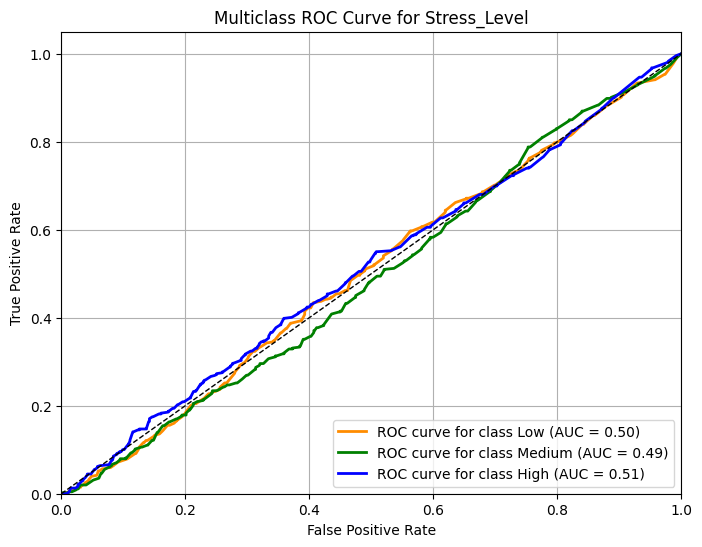

In [ ]:
#  Binarize the output labels (one-hot encoding)
classes = ['Low', 'Medium', 'High']
y_test_bin = label_binarize(y_test, classes=classes)
n_classes = y_test_bin.shape[1]

#  Get prediction probabilities
y_score = model.predict_proba(X_test)

#  Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(8, 6))
colors = ['darkorange', 'green', 'blue']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve for class {classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve for Stress_Level')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

## **Logistic Regression:**

In [ ]:

# Encode categorical columns
df_copy = df.copy()
features = ['Stress_Level', 'Mental_Health_Status', 'Technology_Usage_Hours']
target = 'Online_Support_Usage'

label_encoders = {}
for col in features + [target]:
    if df_copy[col].dtype == 'object':
        le = LabelEncoder()
        df_copy[col] = le.fit_transform(df_copy[col])
        label_encoders[col] = le

# Define inputs and target
X = df_copy[features]
y = df_copy[target]

# ----------------------- Using K-Fold Cross Validation -----------------------
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LogisticRegression()

# Predict using cross-validation
y_pred = cross_val_predict(model, X, y, cv=kf)
y_proba = cross_val_predict(model, X, y, cv=kf, method="predict_proba")[:, 1]

# ---------------------------- Evaluate the model -----------------------------
accuracy = accuracy_score(y, y_pred)
precision = precision_score(y, y_pred)
recall = recall_score(y, y_pred)
f1 = f1_score(y, y_pred)
conf_matrix = confusion_matrix(y, y_pred)
report = classification_report(y, y_pred)

# Print the results
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("\nConfusion Matrix:\n", conf_matrix)
print("\nClassification Report:\n", report)


Accuracy: 0.506706857573474
Precision: 0.5066174207448446
Recall: 0.49638118214716526
F1 Score: 0.5014470677837014

Confusion Matrix:
 [[1716 1603]
 [1670 1646]]

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.52      0.51      3319
           1       0.51      0.50      0.50      3316

    accuracy                           0.51      6635
   macro avg       0.51      0.51      0.51      6635
weighted avg       0.51      0.51      0.51      6635



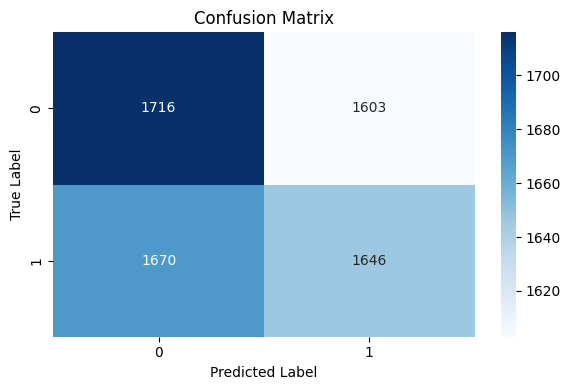

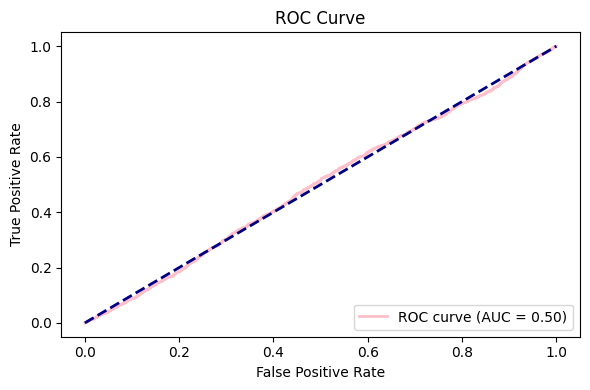

In [ ]:
# ------------------------ Visualize Confusion Matrix ------------------------
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()
print("\n\n")

# ---------------------------- Visualize ROC Curve ----------------------------
fpr, tpr, thresholds = roc_curve(y, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='pink', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()


## **SVC (Support Vector Classifier):**

In [ ]:

# Step 1: Prepare features (X) and target (y)
X = df[['Stress_Level', 'Sleep_Hours', 'Physical_Activity_Hours', 'Online_Support_Usage']].copy()
y = df['Mental_Health_Status']

# Step 2: Encode categorical variables
le = LabelEncoder()
X['Stress_Level'] = le.fit_transform(X['Stress_Level'])
X['Online_Support_Usage'] = le.fit_transform(X['Online_Support_Usage'])
y = le.fit_transform(y)  # Encode the target variable

# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Step 4: Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 5: Train an SVM classifier with balanced class weights
svm_model = SVC(kernel='linear', class_weight='balanced') # Now SVC is defined
svm_model.fit(X_train_scaled, y_train)

# Step 6: Make predictions and evaluate the model
y_pred = svm_model.predict(X_test_scaled)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred, zero_division=0))

Confusion Matrix:
[[114 103 101  74]
 [128 102 114  76]
 [143  94 123  73]
 [107 104 126  77]]

Classification Report:
              precision    recall  f1-score   support

           0       0.23      0.29      0.26       392
           1       0.25      0.24      0.25       420
           2       0.27      0.28      0.27       433
           3       0.26      0.19      0.22       414

    accuracy                           0.25      1659
   macro avg       0.25      0.25      0.25      1659
weighted avg       0.25      0.25      0.25      1659



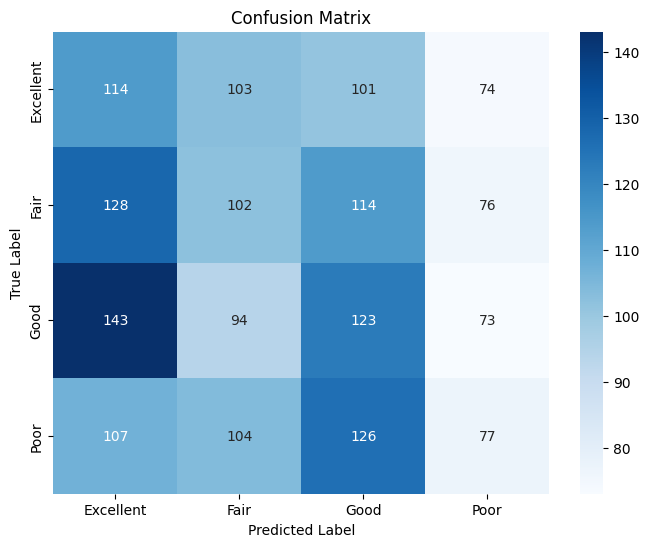

              precision    recall  f1-score   support

   Excellent       0.23      0.29      0.26       392
        Fair       0.25      0.24      0.25       420
        Good       0.27      0.28      0.27       433
        Poor       0.26      0.19      0.22       414

    accuracy                           0.25      1659
   macro avg       0.25      0.25      0.25      1659
weighted avg       0.25      0.25      0.25      1659



In [ ]:
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(df['Mental_Health_Status'])

labels = le_target.classes_

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels,
            yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

print(classification_report(y_test, y_pred, target_names=labels, zero_division=0))

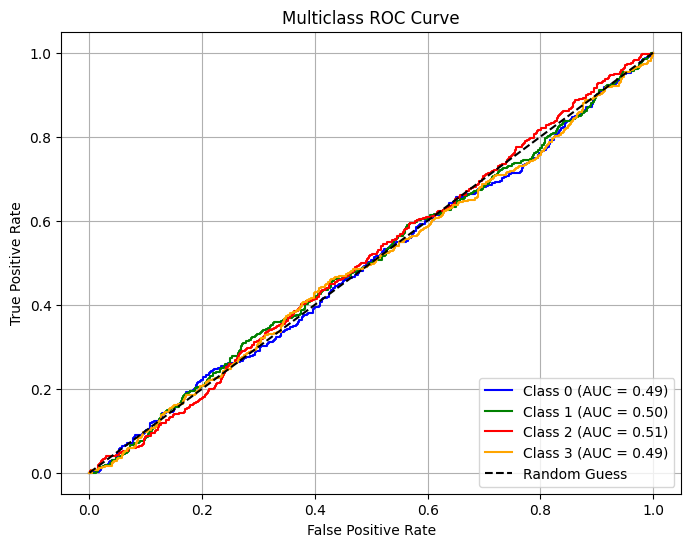

In [ ]:
# Step 7: Multiclass ROC Curve
# Binarize the output labels
y_test_bin = label_binarize(y_test, classes=np.unique(y))
n_classes = y_test_bin.shape[1]

# Train One-vs-Rest SVM for ROC
ovr_svm = OneVsRestClassifier(SVC(kernel='linear', probability=True, class_weight='balanced'))
ovr_svm.fit(X_train_scaled, y_train)
y_score = ovr_svm.predict_proba(X_test_scaled)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
colors = ['blue', 'green', 'red', 'orange', 'purple']
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=colors[i % len(colors)],
             label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.title('Multiclass ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

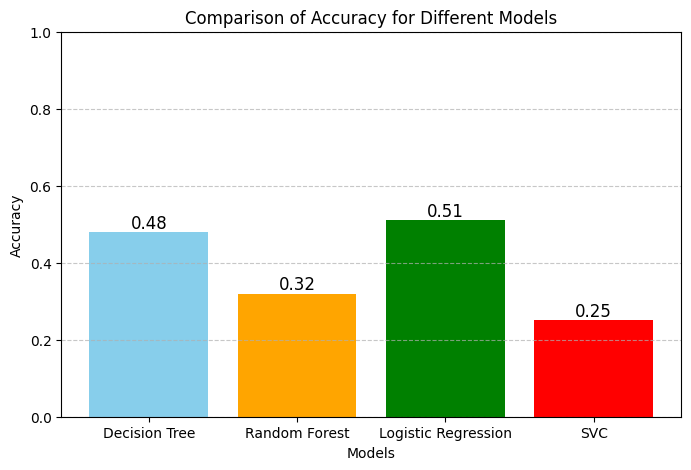

In [ ]:
models = ['Decision Tree', 'Random Forest', 'Logistic Regression', 'SVC']

accuracies = [0.48, 0.32, 0.51, 0.25]

plt.figure(figsize=(8,5))
bars = plt.bar(models, accuracies, color=['skyblue', 'orange', 'green', 'red'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}', ha='center', fontsize=12)

plt.ylim(0, 1)
plt.title('Comparison of Accuracy for Different Models')
plt.ylabel('Accuracy')
plt.xlabel('Models')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#*Lab #4: Clustering*

## **K-Means:**

In [ ]:
# Display the first 5 rows to check the data
print("First 5 rows of the data:")
print(df.head())

# Select only numeric columns (important for scaling)
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
data_numeric = df[numeric_cols]

# Create the scaler object and apply scaling
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_numeric)

# Convert the result to a DataFrame with the same column names
scaled_df = pd.DataFrame(data_scaled, columns=numeric_cols)

# Display the data after scaling
print("\nData after scaling:")
print(scaled_df.head())

First 5 rows of the data:
      User_ID  Age  Gender  Technology_Usage_Hours  Social_Media_Usage_Hours  \
0  USER-00001   23  Female                    6.57                      6.00   
1  USER-00002   21    Male                    3.01                      2.57   
2  USER-00003   51    Male                    3.04                      6.14   
3  USER-00004   25  Female                    3.84                      4.48   
4  USER-00005   53    Male                    1.20                      0.56   

   Gaming_Hours  Screen_Time_Hours Mental_Health_Status Stress_Level  \
0          0.68              12.36                 Good          Low   
1          3.74               7.61                 Poor         High   
2          1.26               3.16                 Fair         High   
3          2.59              13.08            Excellent       Medium   
4          0.29              12.63                 Good          Low   

   Sleep_Hours  Physical_Activity_Hours Support_Systems_Acce

**Using Elbow Method:**

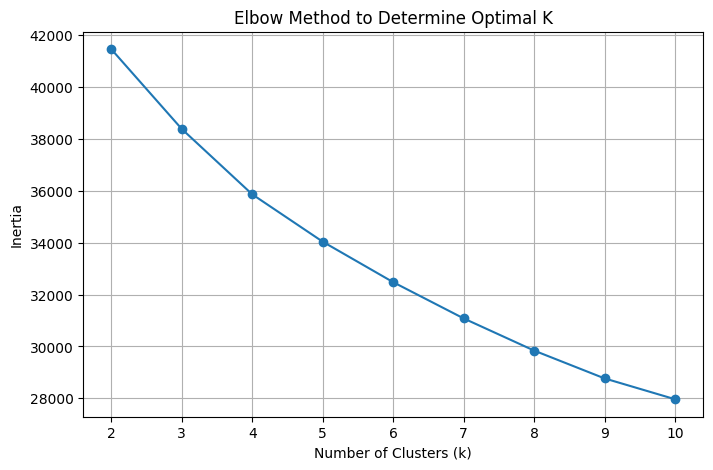

In [ ]:
def plot_elbow_method(data, k_min=2, k_max=10):
    inertia = []
    k_range = range(k_min, k_max + 1)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)

    plt.figure(figsize=(8, 5))
    plt.plot(k_range, inertia, marker='o')
    plt.title('Elbow Method to Determine Optimal K')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

# استدعاء دالة Elbow Method
plot_elbow_method(scaled_df)

In [ ]:
k = 2  # Chosen based on the Elbow Plot
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(scaled_df)

# Add the clustering results to the original DataFrame
df['Cluster'] = clusters

# Display the first 5 rows after adding the cluster labels
print("\nData with cluster labels:")
print(df[['Cluster'] + list(numeric_cols)].head())

score = silhouette_score(scaled_df, clusters)
print(f"Silhouette Score: {score:.3f}")


Data with cluster labels:
   Cluster  Age  Technology_Usage_Hours  Social_Media_Usage_Hours  \
0        1   23                    6.57                      6.00   
1        0   21                    3.01                      2.57   
2        1   51                    3.04                      6.14   
3        1   25                    3.84                      4.48   
4        1   53                    1.20                      0.56   

   Gaming_Hours  Screen_Time_Hours  Sleep_Hours  Physical_Activity_Hours  
0          0.68              12.36         8.01                     6.71  
1          3.74               7.61         7.28                     5.88  
2          1.26               3.16         8.04                     9.81  
3          2.59              13.08         5.62                     5.28  
4          0.29              12.63         5.55                     4.00  
Silhouette Score: 0.106


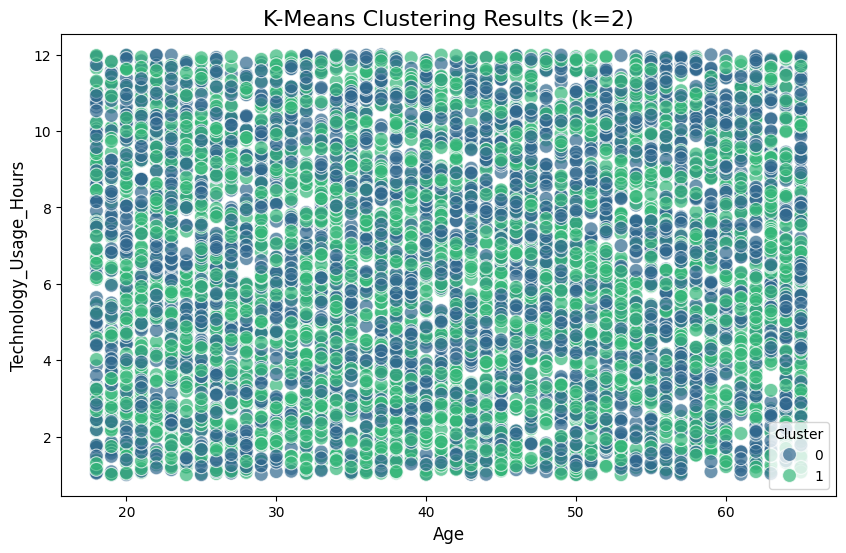

In [ ]:
if len(numeric_cols) >= 2:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df[numeric_cols[0]], y=df[numeric_cols[1]], hue=df['Cluster'],
                    palette='viridis', s=100, alpha=0.7)
    plt.title(f'K-Means Clustering Results (k={k})', fontsize=16)
    plt.xlabel(numeric_cols[0], fontsize=12)
    plt.ylabel(numeric_cols[1], fontsize=12)
    plt.legend(title='Cluster', loc='best')
    plt.show()
else:
    print("Not enough numeric columns to plot a 2D scatter plot.")

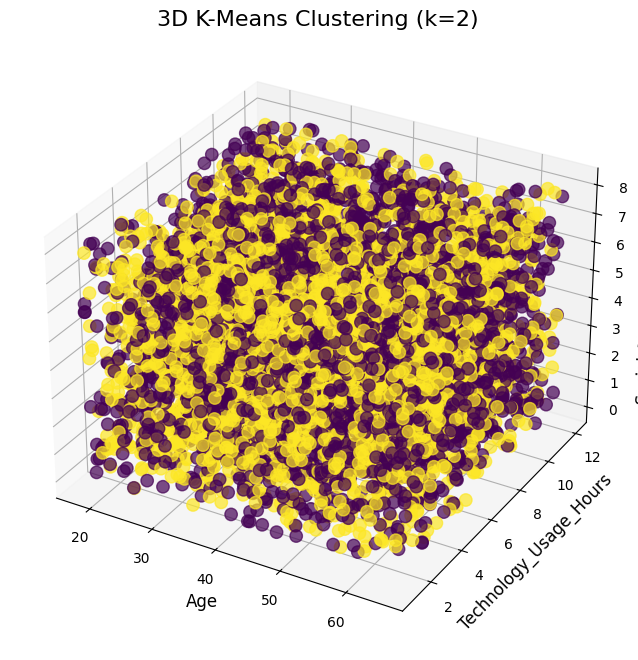

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# تحقق من وجود 3 أعمدة رقمية على الأقل
if len(numeric_cols) >= 3:
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # رسم النقاط وتلوينها حسب التجمع (Cluster)
    scatter = ax.scatter(
        df[numeric_cols[0]], df[numeric_cols[1]], df[numeric_cols[2]],
        c=df['Cluster'], cmap='viridis', s=80, alpha=0.7
    )

    # تسمية المحاور
    ax.set_xlabel(numeric_cols[0], fontsize=12)
    ax.set_ylabel(numeric_cols[1], fontsize=12)
    ax.set_zlabel(numeric_cols[2], fontsize=12)
    ax.set_title(f'3D K-Means Clustering (k={k})', fontsize=16)

    plt.show()
else:
    print("Not enough numeric columns for a 3D scatter plot.")


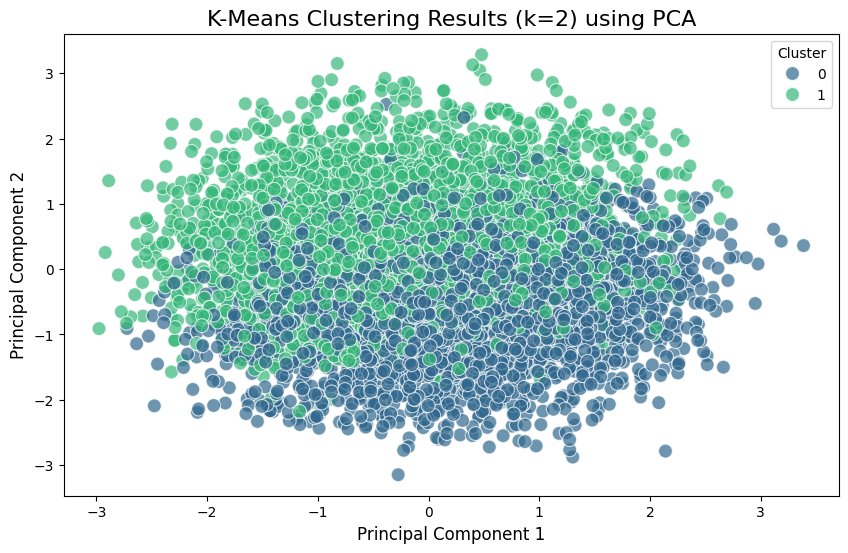

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

numeric_data = df[numeric_cols]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data)

pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2'])
pca_df['Cluster'] = df['Cluster']

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df,
                palette='viridis', s=100, alpha=0.7)
plt.title(f'K-Means Clustering Results (k={k}) using PCA', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Cluster', loc='best')
plt.show()

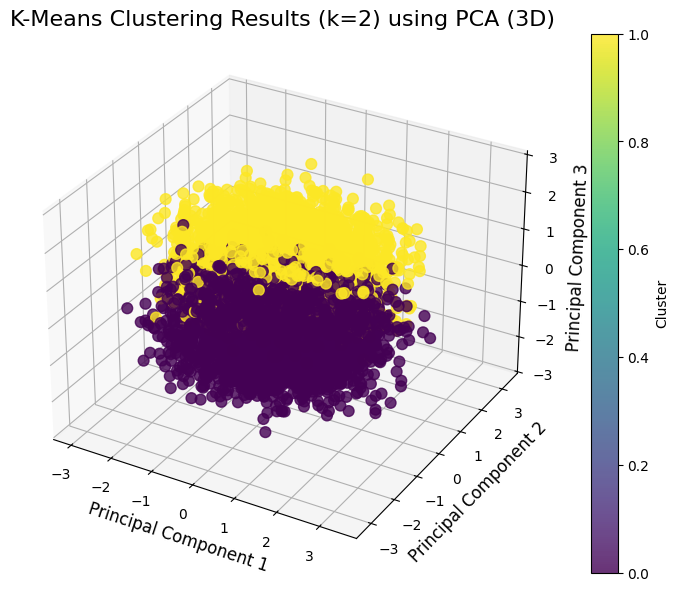

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import pandas as pd

numeric_data = df[numeric_cols]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data)

pca = PCA(n_components=3)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2', 'PC3'])
pca_df['Cluster'] = df['Cluster']

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    pca_df['PC1'], pca_df['PC2'], pca_df['PC3'],
    c=pca_df['Cluster'], cmap='viridis', s=60, alpha=0.8
)

ax.set_title(f'K-Means Clustering Results (k={k}) using PCA (3D)', fontsize=16)
ax.set_xlabel('Principal Component 1', fontsize=12)
ax.set_ylabel('Principal Component 2', fontsize=12)
ax.set_zlabel('Principal Component 3', fontsize=12)
plt.colorbar(scatter, label='Cluster')
plt.show()

## **Hierarchical Agglomerative Clustering:**

**Using dendrogram cutting:**

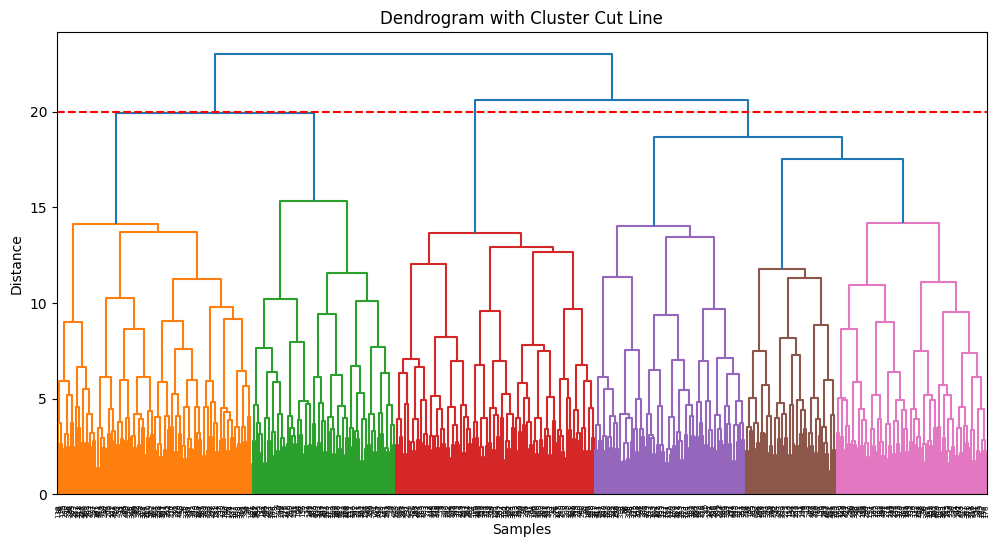

In [ ]:
# Drop non-informative column
df = df.drop(columns=['User_ID'])

# Encode categorical features
categorical_cols = ['Gender', 'Mental_Health_Status', 'Stress_Level',
                    'Support_Systems_Access', 'Work_Environment_Impact', 'Online_Support_Usage']
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Scale numerical features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)

# Sample subset for dendrogram
sample_data = pca_data[:500]
linked = linkage(sample_data, method='ward')

# Plot dendrogram with horizontal cut line
plt.figure(figsize=(12, 6))
dendrogram(linked)
plt.axhline(y=20, color='red', linestyle='--')  # Adjust y to control cluster cut
plt.title('Dendrogram with Cluster Cut Line')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

In [ ]:
# Apply Agglomerative Clustering based on visual cut (height = 20, at 2 clusters)
cluster_model = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
cluster_labels = cluster_model.fit_predict(scaled_data)

# Add the cluster labels to your original DataFrame
df['Cluster'] = cluster_labels

# Evaluate
score = silhouette_score(scaled_data, cluster_labels)
print(f"Silhouette Score: {score:.3f}")

Silhouette Score: 0.064


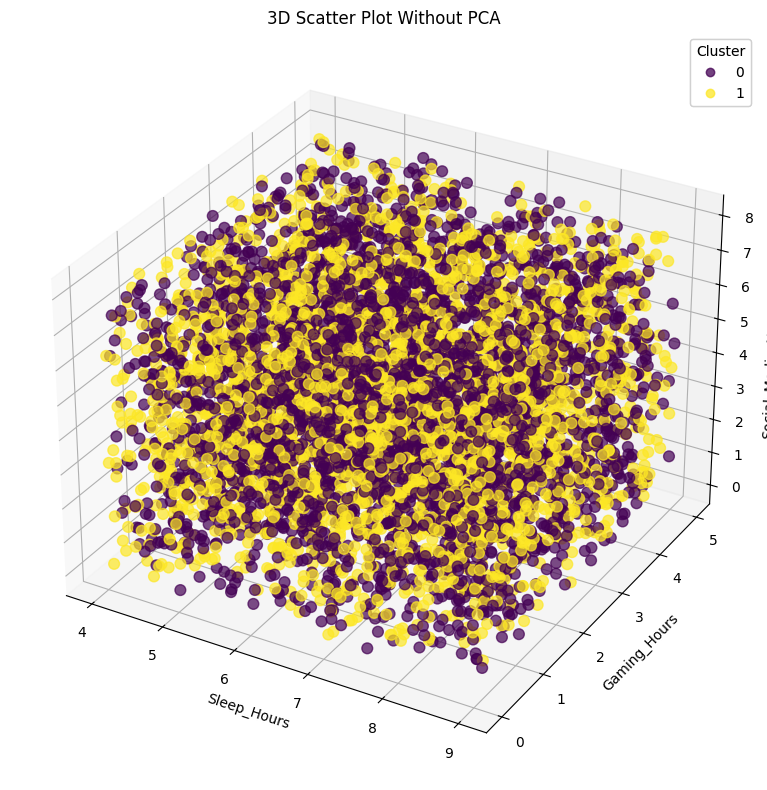

In [ ]:
# Features to use for 3D plot
features = ['Sleep_Hours', 'Gaming_Hours', 'Social_Media_Usage_Hours']

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df[features[0]],
    df[features[1]],
    df[features[2]],
    c=df['Cluster'],
    cmap='viridis',
    s=60,
    alpha=0.7
)

ax.set_xlabel(features[0])
ax.set_ylabel(features[1])
ax.set_zlabel(features[2])
ax.set_title('3D Scatter Plot Without PCA')

legend = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend)

plt.tight_layout()
plt.show()

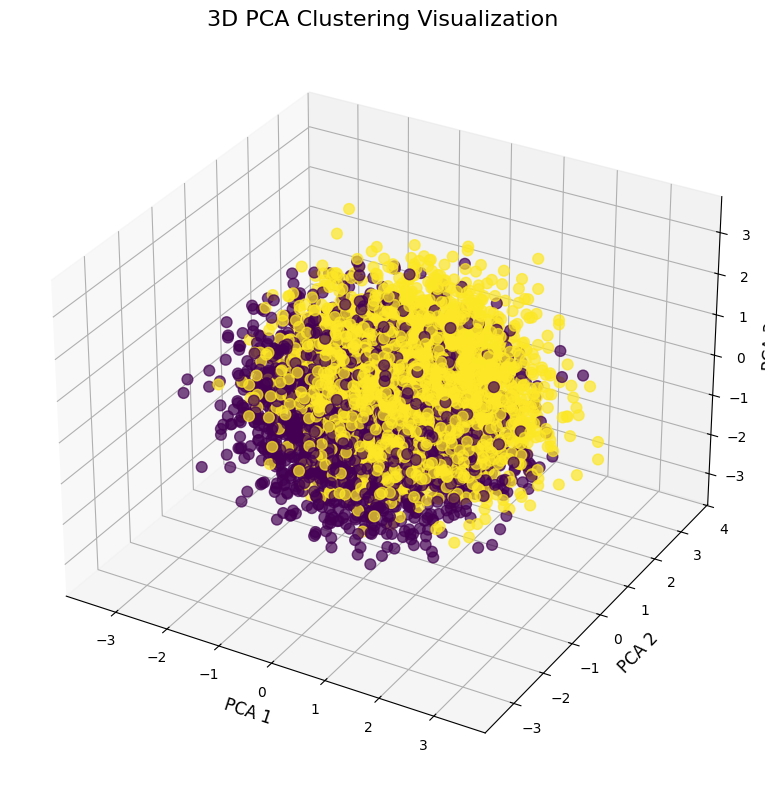

In [ ]:
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'Cluster' in numeric_cols:
    numeric_cols.remove('Cluster')

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numeric_cols])

pca = PCA(n_components=3)
pca_data = pca.fit_transform(scaled_data)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    pca_data[:, 0], pca_data[:, 1], pca_data[:, 2],
    c=df['Cluster'], cmap='viridis', s=60, alpha=0.7
)

ax.set_xlabel('PCA 1', fontsize=12)
ax.set_ylabel('PCA 2', fontsize=12)
ax.set_zlabel('PCA 3', fontsize=12)
ax.set_title('3D PCA Clustering Visualization', fontsize=16)

plt.tight_layout()
plt.show()

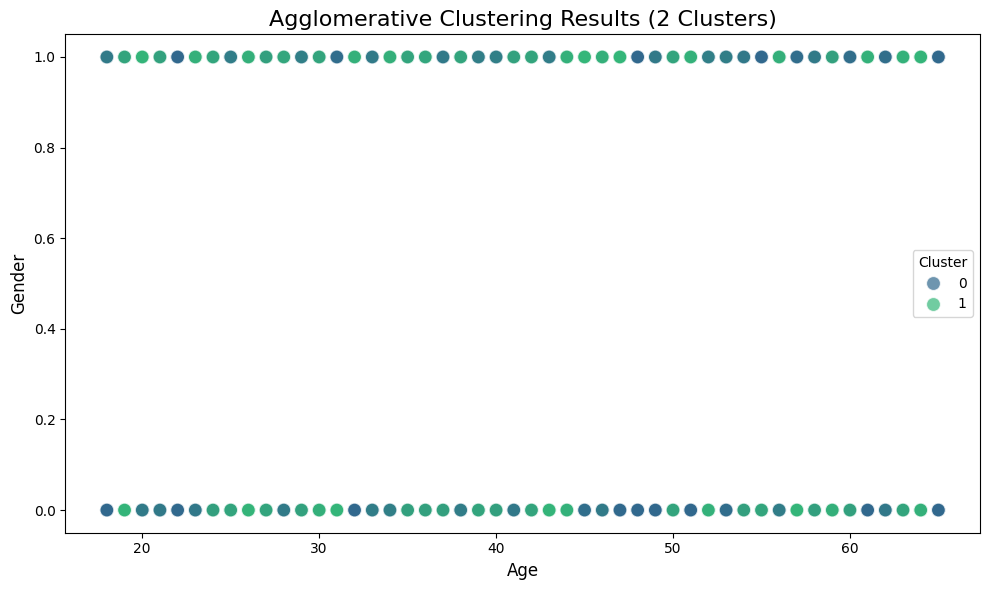

In [ ]:
# Select numeric columns (excluding 'Cluster' if already added)
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'Cluster' in numeric_cols:
    numeric_cols.remove('Cluster')

# Plot only if at least 2 numeric columns are available
if len(numeric_cols) >= 2:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df[numeric_cols[0]],
                    y=df[numeric_cols[1]],
                    hue=df['Cluster'],
                    palette='viridis',
                    s=100,
                    alpha=0.7)

    plt.title(f'Agglomerative Clustering Results (2 Clusters)', fontsize=16)
    plt.xlabel(numeric_cols[0], fontsize=12)
    plt.ylabel(numeric_cols[1], fontsize=12)
    plt.legend(title='Cluster', loc='best')
    plt.tight_layout()
    plt.show()
else:
    print("Not enough numeric columns to plot a 2D scatter plot.")

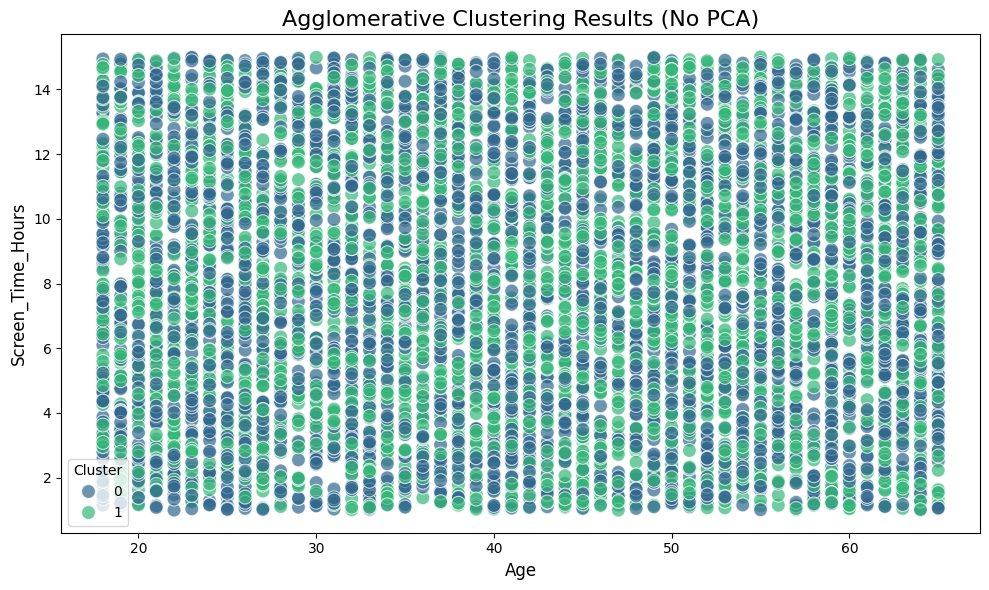

In [ ]:
# Select numeric columns (excluding 'Cluster')
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'Cluster' in numeric_cols:
    numeric_cols.remove('Cluster')

if len(numeric_cols) >= 2:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df[numeric_cols[0]],
                    y=df[numeric_cols[5]],
                    hue=df['Cluster'],
                    palette='viridis',
                    s=100,
                    alpha=0.7)

    plt.title(f'Agglomerative Clustering Results (No PCA)', fontsize=16)
    plt.xlabel(numeric_cols[0], fontsize=12)
    plt.ylabel(numeric_cols[5], fontsize=12)
    plt.legend(title='Cluster', loc='best')
    plt.tight_layout()
    plt.show()
else:
    print("Not enough numeric columns to plot a 2D scatter plot.")

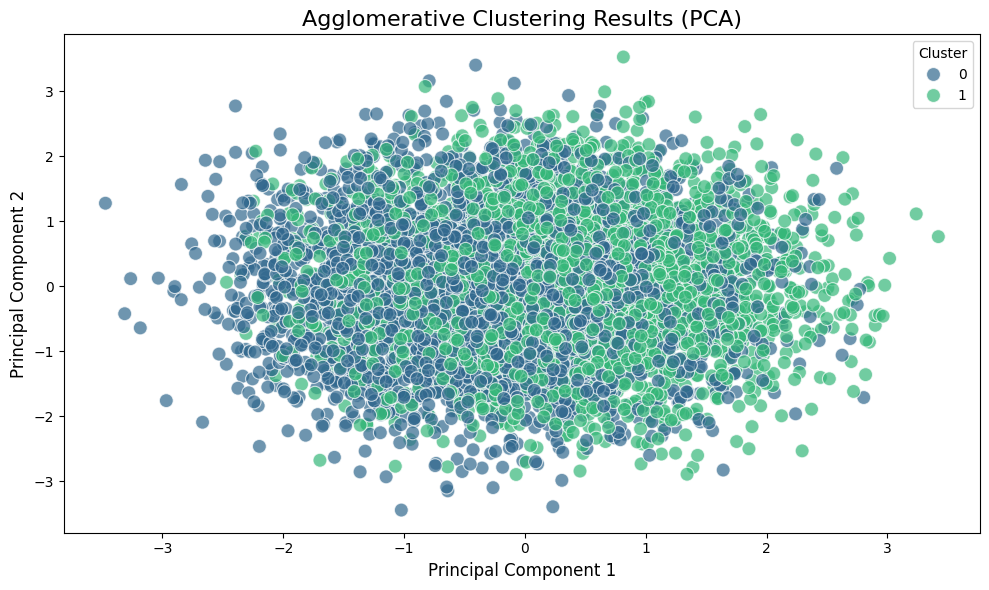

In [ ]:
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'Cluster' in numeric_cols:
    numeric_cols.remove('Cluster')

if len(numeric_cols) >= 2:
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df[numeric_cols])

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Create a temporary DataFrame for plotting
    pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
    pca_df['Cluster'] = df['Cluster'].values

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df,
                    palette='viridis', s=100, alpha=0.7)

    plt.title('Agglomerative Clustering Results (PCA)', fontsize=16)
    plt.xlabel('Principal Component 1', fontsize=12)
    plt.ylabel('Principal Component 2', fontsize=12)
    plt.legend(title='Cluster', loc='best')
    plt.tight_layout()
    plt.show()
else:
    print("Not enough numeric columns to apply PCA and plot.")

In [ ]:
cluster_means = df.groupby('Cluster').mean(numeric_only=True)
print(cluster_means.T)  # Transpose for readability

Cluster                           0          1
Age                       41.612731  41.598566
Gender                     0.482614   0.530792
Technology_Usage_Hours     6.357830   6.580870
Social_Media_Usage_Hours   3.952084   4.007227
Gaming_Hours               2.536806   2.496507
Screen_Time_Hours          7.946559   8.001059
Mental_Health_Status       1.465508   1.541219
Stress_Level               1.012058   0.980124
Sleep_Hours                6.495967   6.503001
Physical_Activity_Hours    5.002529   5.014288
Support_Systems_Access     0.079080   0.976214
Work_Environment_Impact    1.011778   0.975236
Online_Support_Usage       0.500561   0.498860


#*Lab #5: Anomaly detection and PCA*

## **Machine Learning Models:**

###**Isolation Forest**:

In [ ]:
from sklearn.ensemble import IsolationForest
features = [ 'Social_Media_Usage_Hours',
            'Gaming_Hours',  'Screen_Time_Hours', 'Sleep_Hours', 'Age']
X = df[features].copy()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

iso_model = IsolationForest(random_state=42)
df['iso_anomaly'] = iso_model.fit_predict(X_scaled)

num_outliers = (df['iso_anomaly'] == -1).sum()
print(f"Number of anomalies detected by Isolation Forest: {num_outliers}")

Number of anomalies detected by Isolation Forest: 4554


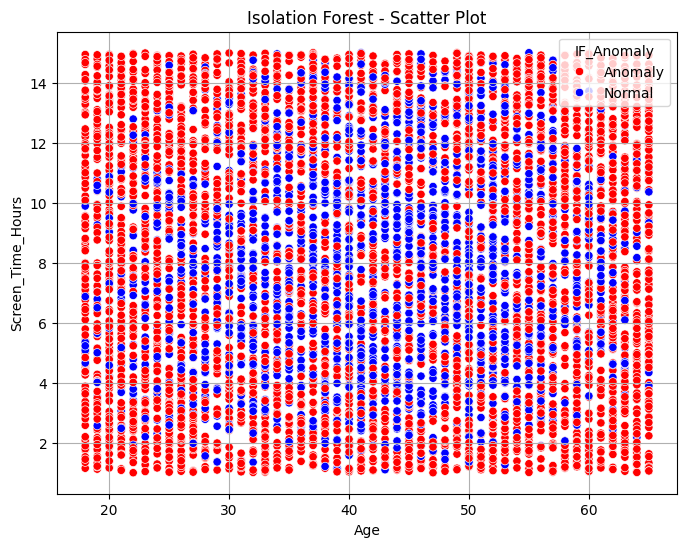

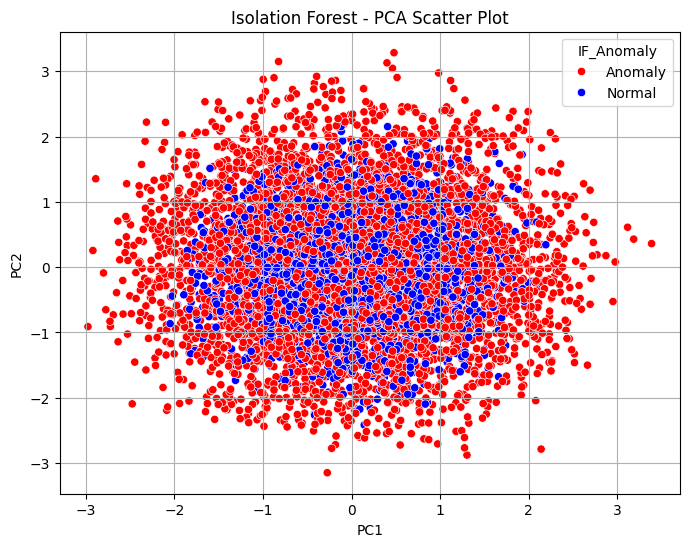

In [ ]:
import pandas as pd
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns


numeric_columns = df.select_dtypes(include='number').columns.tolist()
X = df[numeric_columns]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

iso = IsolationForest(random_state=42)
df['IF_Anomaly'] = iso.fit_predict(X_scaled)

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df,
                x='Age', y='Screen_Time_Hours',
                hue=df['IF_Anomaly'].map({1: 'Normal', -1: 'Anomaly'}),
                palette={'Normal': 'blue', 'Anomaly': 'red'})
plt.title('Isolation Forest - Scatter Plot')
plt.grid(True)
plt.show()

pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)
df['PC1'] = pca_result[:, 0]
df['PC2'] = pca_result[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df,
                x='PC1', y='PC2',
                hue=df['IF_Anomaly'].map({1: 'Normal', -1: 'Anomaly'}),
                palette={'Normal': 'blue', 'Anomaly': 'red'})
plt.title('Isolation Forest - PCA Scatter Plot')
plt.grid(True)
plt.show()

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

X = df[['Technology_Usage_Hours', 'Sleep_Hours']]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

iso_model = IsolationForest(contamination=0.05, random_state=42)
df['anomaly'] = iso_model.fit_predict(X_scaled)

df_anomaly_tech_sleep = df[df['anomaly'] == -1]

print("عدد الحالات الشاذة باستخدام Isolation Forest:", df_anomaly_tech_sleep.shape[0])
print(df_anomaly_tech_sleep[['User_ID', 'Technology_Usage_Hours', 'Sleep_Hours']])

عدد الحالات الشاذة باستخدام Isolation Forest: 332
         User_ID  Technology_Usage_Hours  Sleep_Hours
11    USER-00017                    2.03         8.95
15    USER-00022                    1.27         4.01
18    USER-00027                    1.16         4.44
29    USER-00041                    1.04         7.59
45    USER-00066                   11.56         4.13
...          ...                     ...          ...
6511  USER-09800                   11.93         4.80
6529  USER-09834                   11.38         4.22
6559  USER-09882                    1.24         4.18
6568  USER-09892                    1.08         7.47
6597  USER-09947                   11.72         4.03

[332 rows x 3 columns]


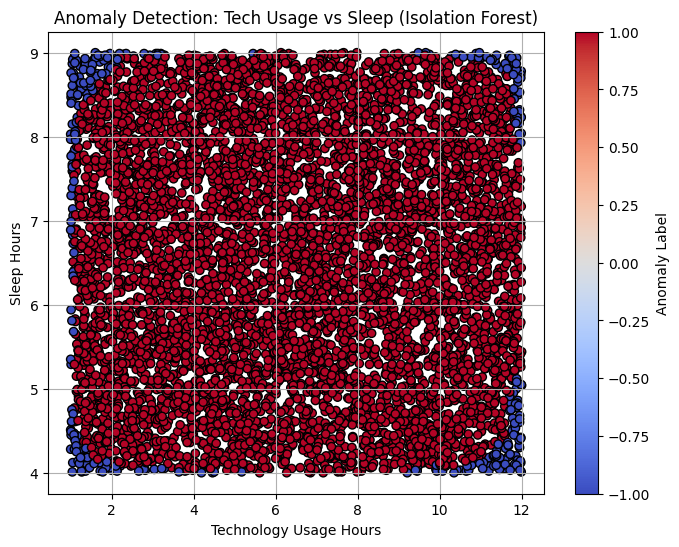

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.scatter(df['Technology_Usage_Hours'], df['Sleep_Hours'],
            c=df['anomaly'], cmap='coolwarm', edgecolors='k')
plt.xlabel('Technology Usage Hours')
plt.ylabel('Sleep Hours')
plt.title('Anomaly Detection: Tech Usage vs Sleep (Isolation Forest)')
plt.grid(True)
plt.colorbar(label='Anomaly Label')
plt.show()

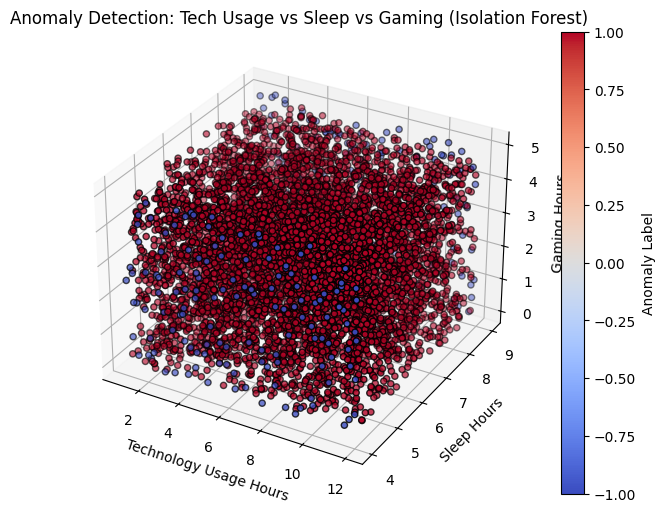

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(df['Technology_Usage_Hours'], df['Sleep_Hours'], df['Gaming_Hours'],
                c=df['anomaly'], cmap='coolwarm', edgecolors='k')

ax.set_xlabel('Technology Usage Hours')
ax.set_ylabel('Sleep Hours')
ax.set_zlabel('Gaming Hours')
ax.set_title('Anomaly Detection: Tech Usage vs Sleep vs Gaming (Isolation Forest)')

plt.colorbar(sc, label='Anomaly Label')
plt.show()

### **One-Class SVM:**

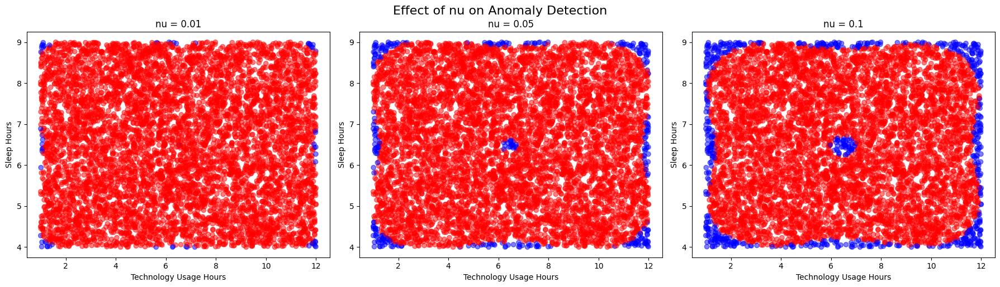



anomaly
 1    6573
-1      62
Name: count, dtype: int64




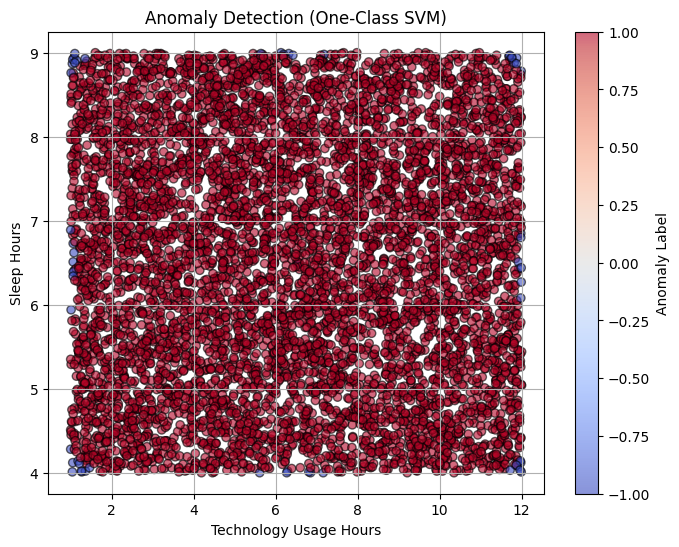

In [ ]:
# Map the 'Stress_Level' to numeric values
stress_map = {'Low': 0, 'Medium': 1, 'High': 2}
df['Stress_Level'] = df['Stress_Level'].map(stress_map)

# Now select the features again (after mapping)
X = df[['Technology_Usage_Hours', 'Sleep_Hours']]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Different nu values to compare
nu_values = [0.01, 0.05, 0.1]

plt.figure(figsize=(18, 5))

for i, nu in enumerate(nu_values):
    model = OneClassSVM(kernel='rbf', gamma='auto', nu=nu)
    model.fit(X_scaled)
    preds = model.predict(X_scaled)

    # Visualization
    plt.subplot(1, 3, i + 1)
    plt.title(f"nu = {nu}")
    plt.scatter(X['Technology_Usage_Hours'], X['Sleep_Hours'],
                c=['blue' if p == -1 else 'red' for p in preds], alpha=0.5)
    plt.xlabel('Technology Usage Hours')
    plt.ylabel('Sleep Hours')

plt.tight_layout()
plt.suptitle("Effect of nu on Anomaly Detection", fontsize=16, y=1.02)
plt.show()
print("\n")


# Initialize and train the One-Class SVM model
oc_svm = OneClassSVM(kernel='rbf', nu=0.01, gamma='scale')  # nu ≈ expected outlier ratio
oc_svm.fit(X_scaled)

# Predict anomalies (-1 for outlier, 1 for normal)
df['anomaly'] = oc_svm.predict(X_scaled)

# Show how many normal vs. outlier points
print(df['anomaly'].value_counts())
print("\n")


# Visualize the anomalies on a scatter plot
plt.figure(figsize=(8,6))
plt.scatter(df['Technology_Usage_Hours'], df['Sleep_Hours'],
            c=df['anomaly'], cmap='coolwarm', alpha=0.6, edgecolors='k')
plt.title("Anomaly Detection (One-Class SVM)")
plt.xlabel("Technology Usage Hours")
plt.ylabel("Sleep Hours")
plt.grid(True)
plt.colorbar(label='Anomaly Label')
plt.show()

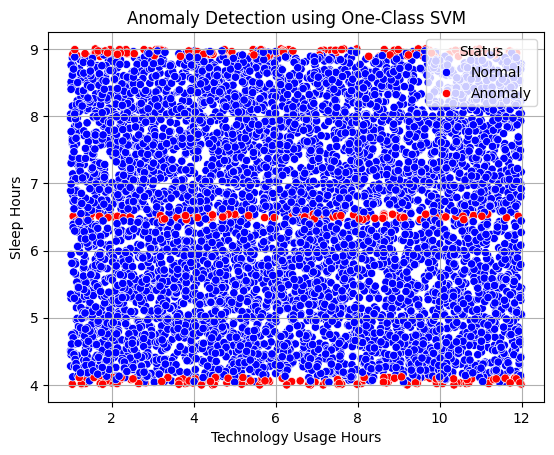

In [ ]:


scaler = StandardScaler()
numeric_columns = df.select_dtypes(include='number').columns.tolist()
X = df[numeric_columns]

svm_model = OneClassSVM(kernel='rbf', gamma='scale', nu=0.05)
df['SVM_Anomaly'] = (svm_model.fit_predict(X_scaled) == -1).astype(int)

# Scatter Plot
sns.scatterplot(data=df, x='Technology_Usage_Hours', y='Sleep_Hours',
                hue=df['SVM_Anomaly'].map({0: 'Normal', 1: 'Anomaly'}),
                palette={'Normal': 'blue', 'Anomaly': 'red'})
plt.title("Anomaly Detection using One-Class SVM")
plt.xlabel("Technology Usage Hours")
plt.ylabel("Sleep Hours")
plt.legend(title="Status")
plt.grid(True)
plt.show()

### **LOF:**

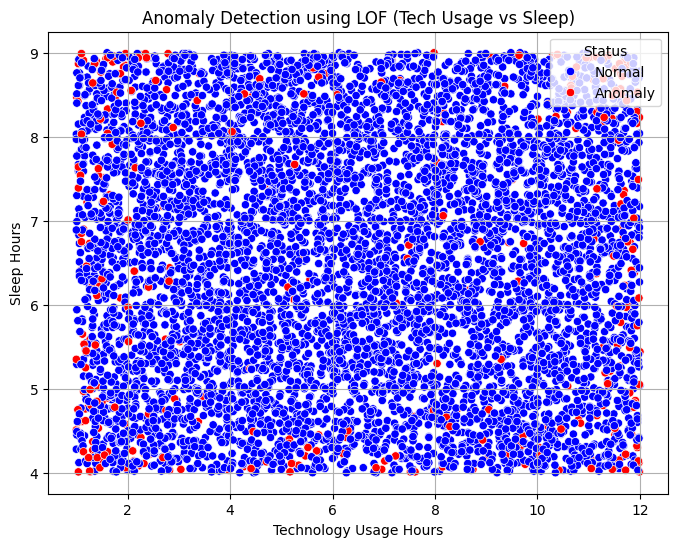

In [ ]:
numeric_cols = ['Technology_Usage_Hours', 'Social_Media_Usage_Hours', 'Gaming_Hours',
                'Screen_Time_Hours', 'Sleep_Hours', 'Physical_Activity_Hours']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[numeric_cols])

lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
df['LOF_Anomaly'] = lof.fit_predict(X_scaled)

df['LOF_Anomaly_Label'] = df['LOF_Anomaly'].map({1: 'Normal', -1: 'Anomaly'})

plt.figure(figsize=(8,6))
sns.scatterplot(data=df,
                x='Technology_Usage_Hours',
                y='Sleep_Hours',
                hue='LOF_Anomaly_Label',
                palette={'Normal': 'blue', 'Anomaly': 'red'})
plt.title("Anomaly Detection using LOF (Tech Usage vs Sleep)")
plt.xlabel("Technology Usage Hours")
plt.ylabel("Sleep Hours")
plt.legend(title="Status")
plt.grid(True)
plt.show()

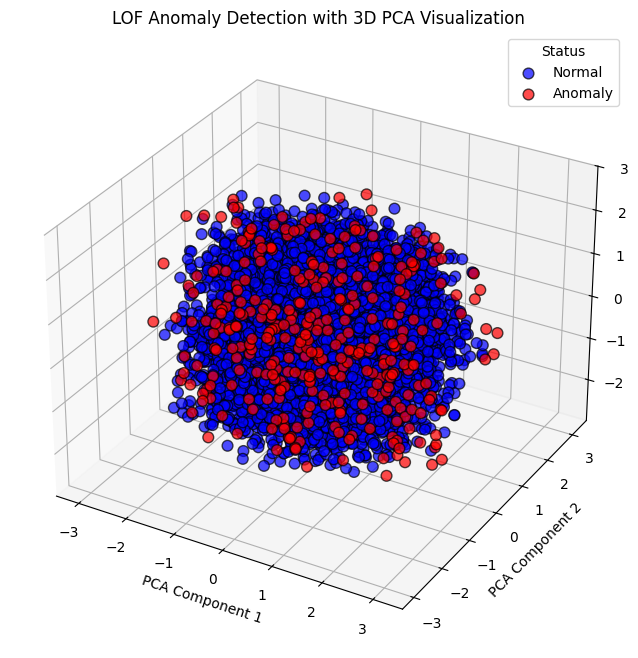

In [ ]:
numeric_cols = ['Technology_Usage_Hours', 'Social_Media_Usage_Hours', 'Gaming_Hours',
                'Screen_Time_Hours', 'Sleep_Hours', 'Physical_Activity_Hours']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[numeric_cols])

lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
df['LOF_Anomaly'] = lof.fit_predict(X_scaled)
df['LOF_Anomaly_Label'] = df['LOF_Anomaly'].map({1: 'Normal', -1: 'Anomaly'})

pca = PCA(n_components=3)
pca_result = pca.fit_transform(X_scaled)
df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]
df['PCA3'] = pca_result[:, 2]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

colors = {'Normal': 'blue', 'Anomaly': 'red'}
labels = df['LOF_Anomaly_Label']

for label in colors:
    ix = labels == label
    ax.scatter(df.loc[ix, 'PCA1'], df.loc[ix, 'PCA2'], df.loc[ix, 'PCA3'],
               c=colors[label], label=label, edgecolor='k', s=60, alpha=0.7)

ax.set_title('LOF Anomaly Detection with 3D PCA Visualization')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.legend(title='Status')
plt.show()

## **Statistical:**

### **Z Score**:

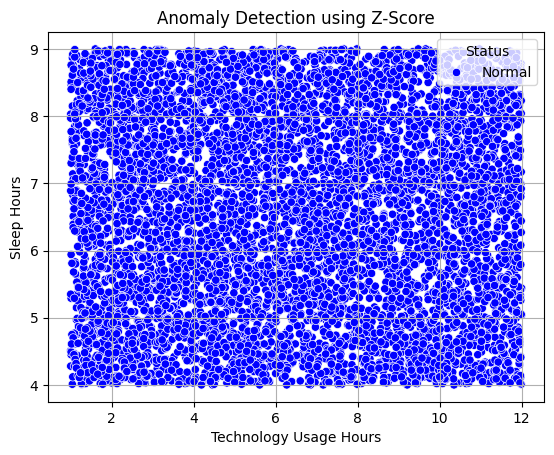

In [ ]:
numeric_columns = df.select_dtypes(include='number').columns.tolist()
X = df[numeric_columns]
z_scores = np.abs(zscore(df[numeric_cols]))

z_anomalies = (z_scores > 3).any(axis=1)
df['Zscore_Anomaly'] = z_anomalies.astype(int)

sns.scatterplot(data=df, x='Technology_Usage_Hours', y='Sleep_Hours',
                hue=df['Zscore_Anomaly'].map({0: 'Normal', 1: 'Anomaly'}),
                palette={'Normal': 'blue', 'Anomaly': 'red'})

plt.title("Anomaly Detection using Z-Score")
plt.xlabel("Technology Usage Hours")
plt.ylabel("Sleep Hours")
plt.legend(title="Status")
plt.grid(True)
plt.show()

### **IQR**:

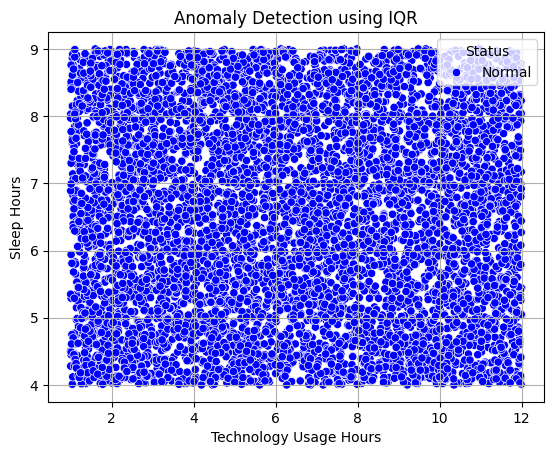

In [ ]:


numeric_cols = ['Technology_Usage_Hours', 'Sleep_Hours']

Q1 = df[numeric_cols].quantile(0.25)
Q3 = df[numeric_cols].quantile(0.75)
IQR = Q3 - Q1

iqr_anomalies = ((df[numeric_cols] < (Q1 - 1.5 * IQR)) | (df[numeric_cols] > (Q3 + 1.5 * IQR))).any(axis=1)
df['IQR_Anomaly'] = iqr_anomalies.astype(int)

sns.scatterplot(data=df, x='Technology_Usage_Hours', y='Sleep_Hours',
                hue=df['IQR_Anomaly'].map({0: 'Normal', 1: 'Anomaly'}),
                palette={'Normal': 'blue', 'Anomaly': 'orange'})

plt.title("Anomaly Detection using IQR")
plt.xlabel("Technology Usage Hours")
plt.ylabel("Sleep Hours")
plt.legend(title="Status")
plt.grid(True)
plt.show()